In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import copy

from test_simplify import test_basic, load_net, batch_predict
from test_batch import collect_predict,adaptive_chain_smoother,load_predict

In [2]:
%matplotlib inline

%load_ext autoreload
%autoreload 2

In [3]:
def plot_trace(x,y, alpha=1.0):
    n = x.shape[0]
    plt.plot(x[:n//3],y[:n//3],'-o',color='r', alpha=alpha)
    plt.plot(x[n//3:n//3*2],y[n//3:n//3*2],'-o',color='g', alpha=alpha)
    plt.plot(x[n//3*2:],y[n//3*2:],'-o',color='b', alpha=alpha)


In [4]:
net = load_net('weights/ssd300_hor_2.pth')

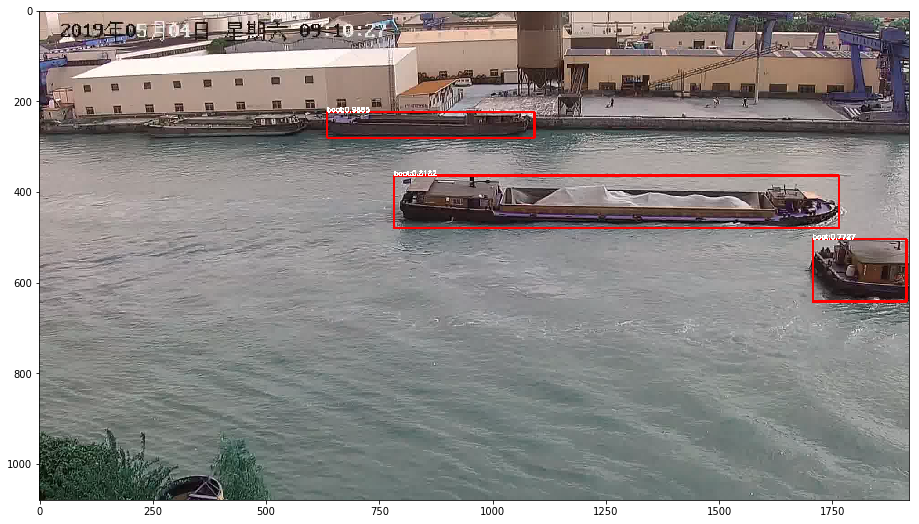

In [5]:
processed = test_basic(net, r'hiv00801_frames\thumb00088.jpg')
plt.figure(figsize=(16,9))
plt.imshow(processed)

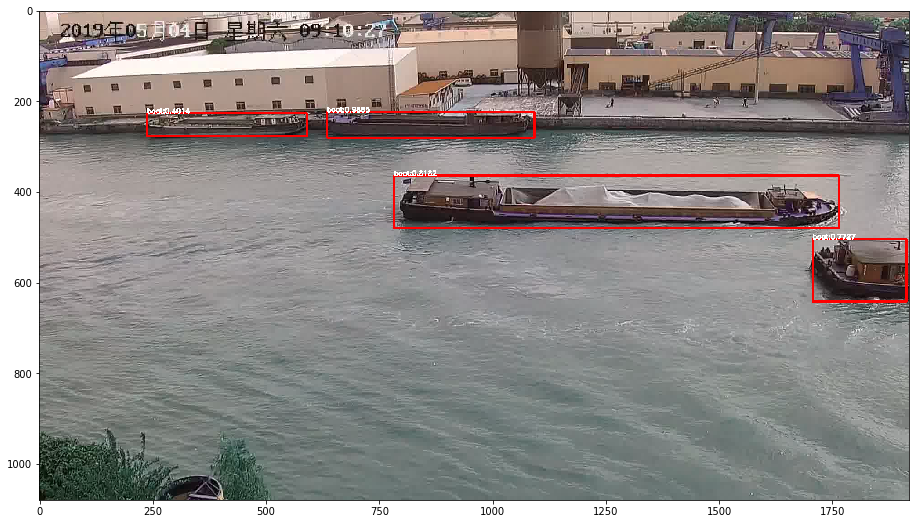

In [6]:
processed = test_basic(net, r'hiv00801_frames\thumb00088.jpg', threshold=0.15)
plt.figure(figsize=(16,9))
plt.imshow(processed)

In [7]:
smoother = lambda arr: adaptive_chain_smoother(arr, F=6)

In [8]:
loaded_raw = load_predict('hiv00801_cache')

In [9]:
loaded = copy.deepcopy(loaded_raw)
collected = collect_predict(loaded, chain_smoother=smoother, jump_tol=60, verbose=True)
sorted([len(chain) for chain in collected['chain_list']], reverse=True)

48 chain detected


[12951,
 6907,
 5935,
 1610,
 1607,
 1440,
 1382,
 1267,
 1253,
 1243,
 979,
 906,
 797,
 660,
 589,
 535,
 516,
 465,
 444,
 399,
 298,
 220,
 190,
 81,
 77,
 40,
 39,
 39,
 32,
 32,
 26,
 26,
 24,
 18,
 12,
 11,
 7,
 7,
 7,
 5,
 5,
 4,
 3,
 2,
 1,
 1,
 1,
 1]

12951


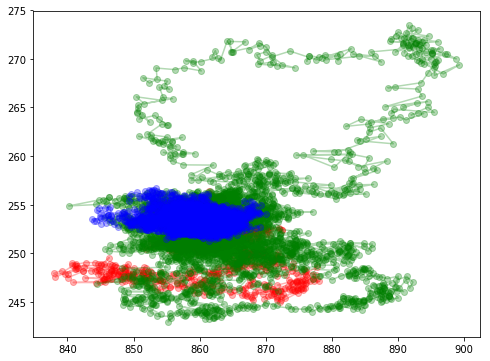

6907


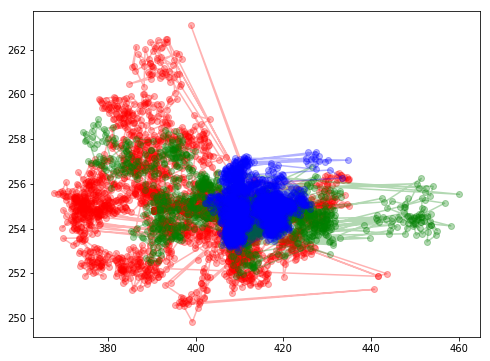

5935


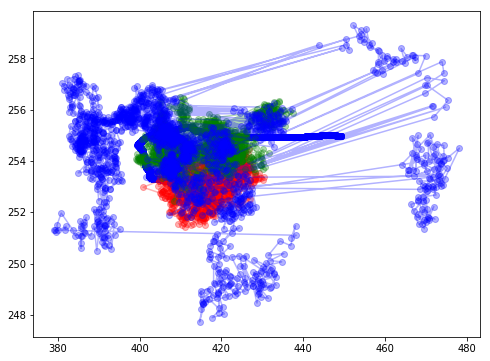

1610


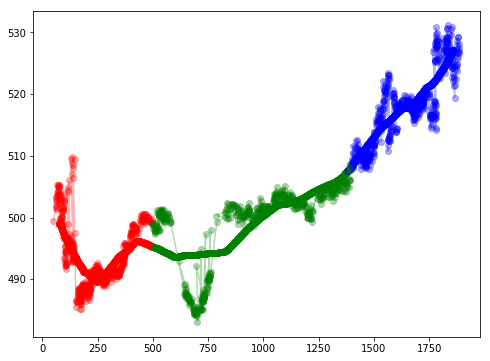

1607


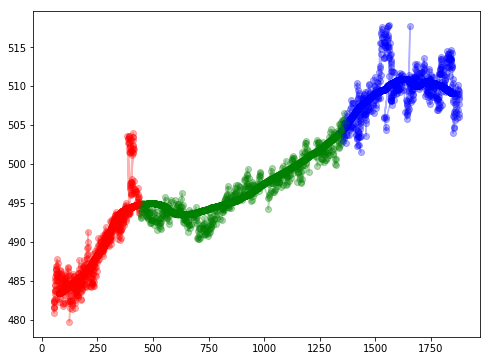

1440


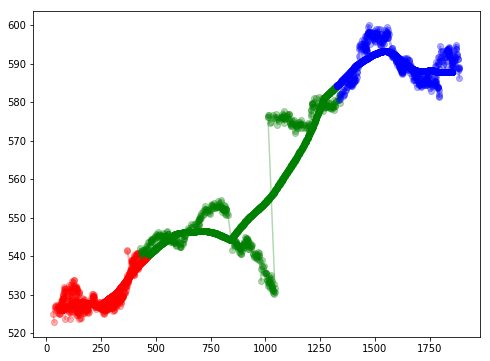

1382


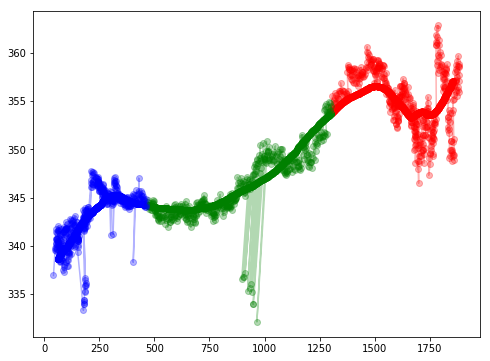

1267


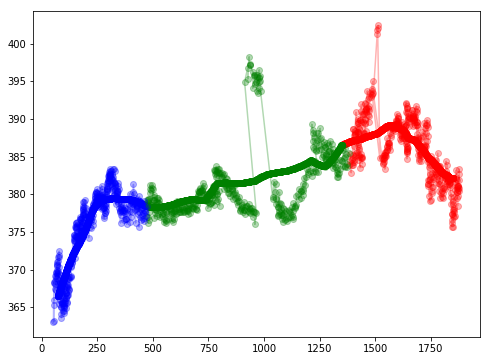

1253


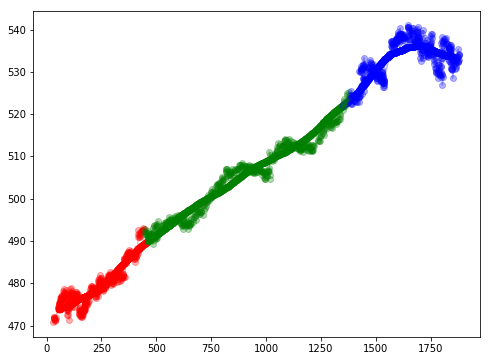

1243


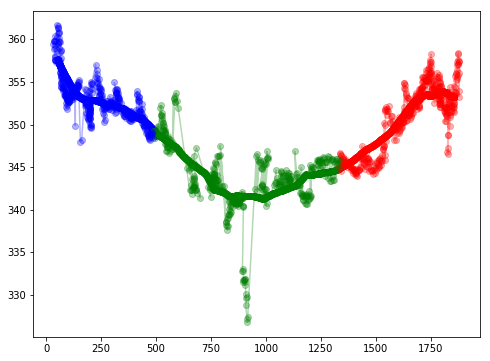

979


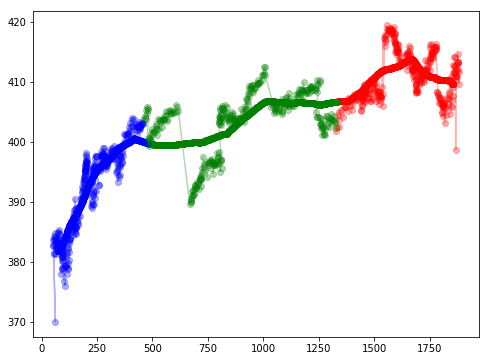

906


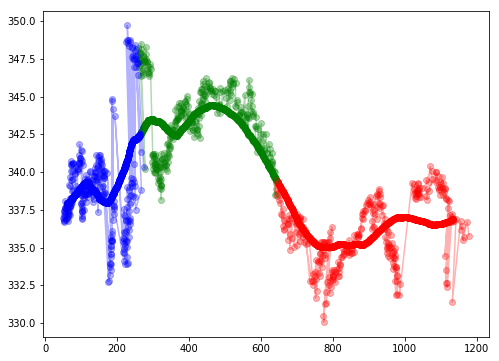

797


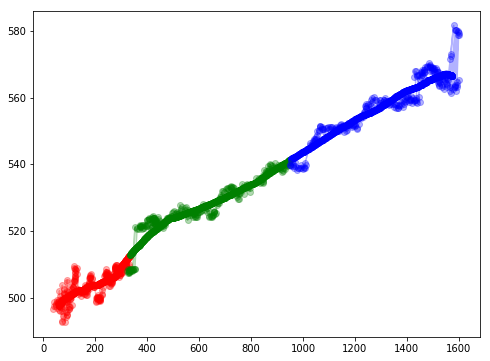

660


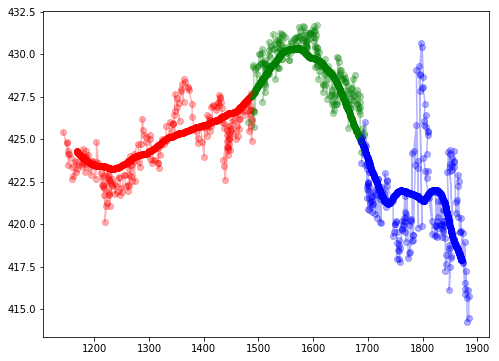

589


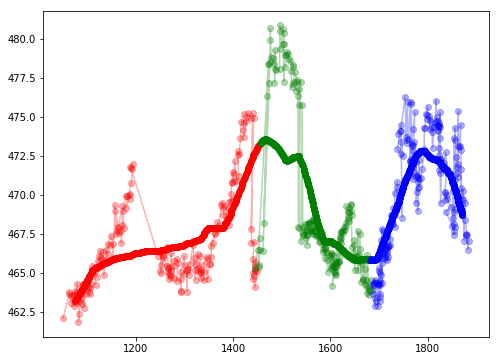

535


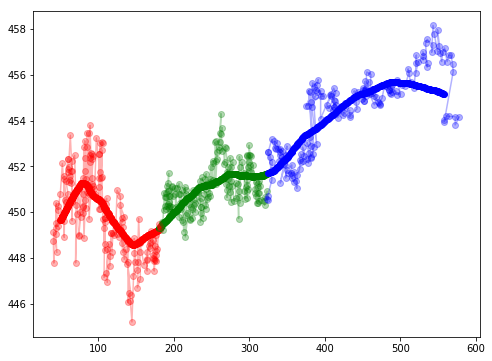

516


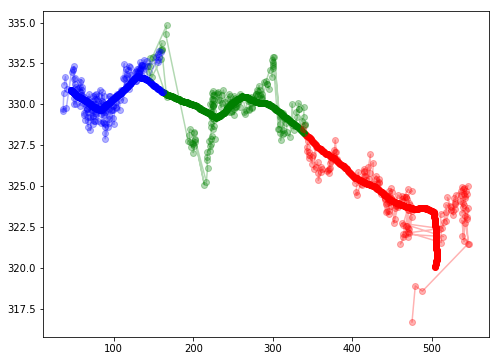

465


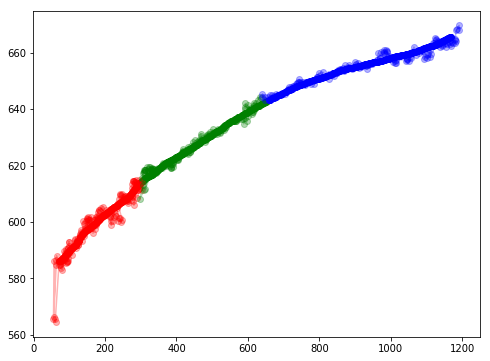

444


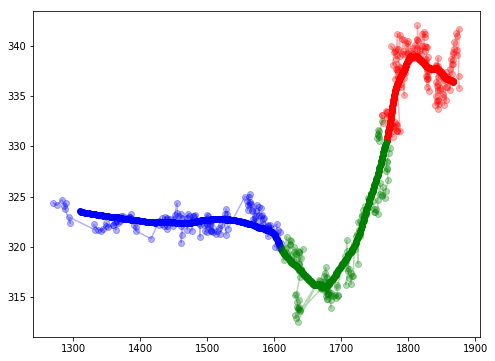

399


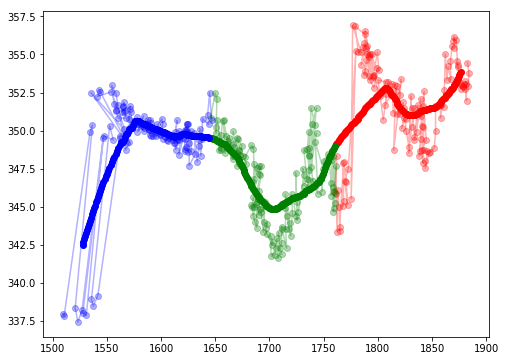

298


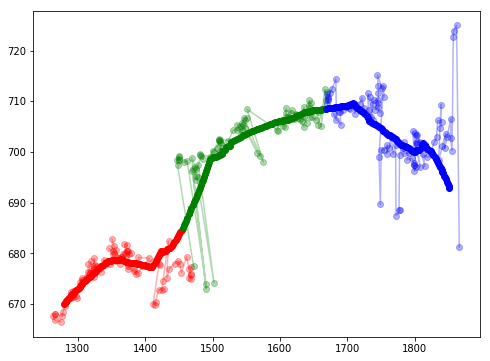

In [10]:
for chain in sorted([chain for chain in collected['chain_list']], reverse=True, key=len)[:21]:
    pt_arr = np.array([box['pt'] for box in chain])
    pt_smoothed_arr = np.array([box['pt_smoothed'] for box in chain])
    if len(pt_arr) <2:
        print('suppressed')
        continue
    print(len(pt_arr))
    x,y = pt_arr[:,::2].mean(axis=1),pt_arr[:,1::2].mean(axis=1)
    x_bar,y_bar = pt_smoothed_arr[:,::2].mean(axis=1),pt_smoothed_arr[:,1::2].mean(axis=1)
    
    plt.figure(figsize=(8,6))
    plot_trace(x_bar, y_bar)
    plot_trace(x,y, alpha=0.3)
    plt.show()

In [11]:
background_bgr = cv2.imread('hor_background2.jpg')
background = cv2.cvtColor(background_bgr, cv2.COLOR_BGR2RGB)

12951


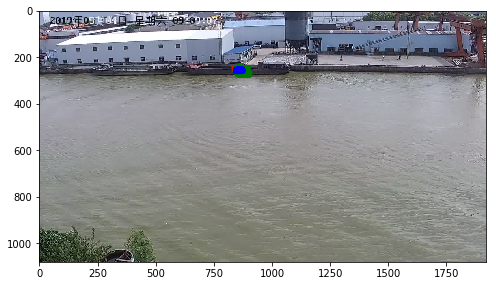

6907


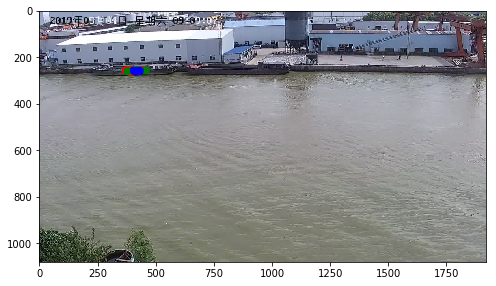

5935


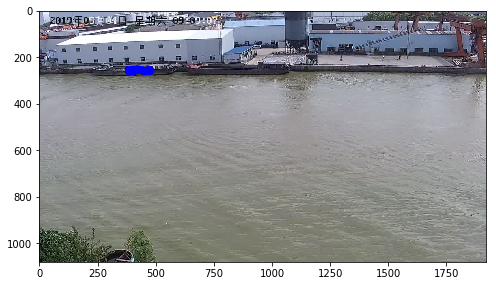

1610


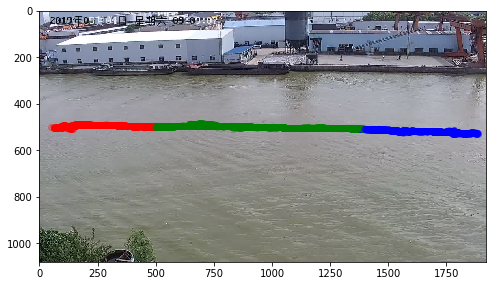

1607


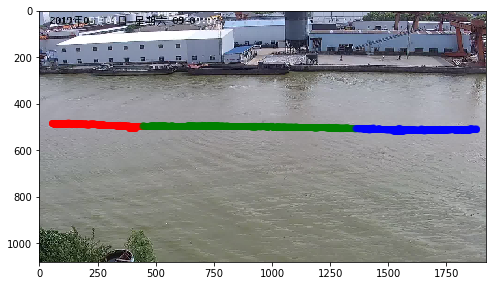

1440


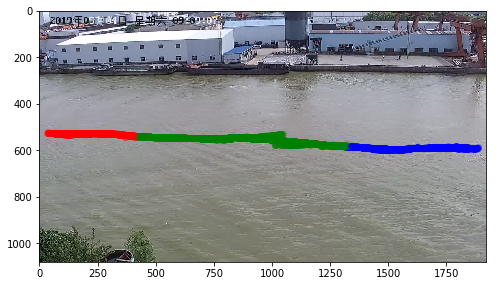

1382


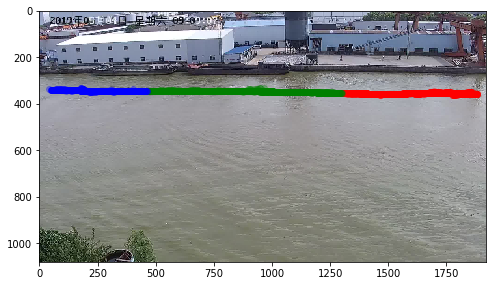

1267


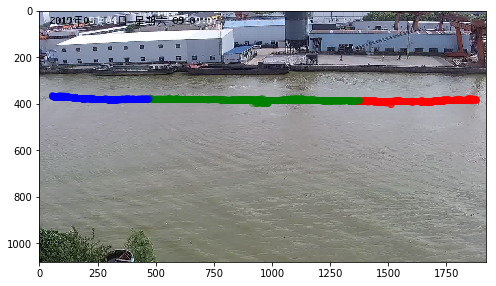

1253


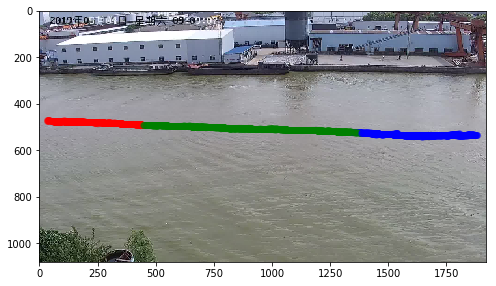

1243


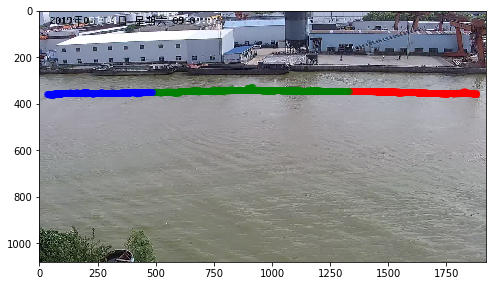

979


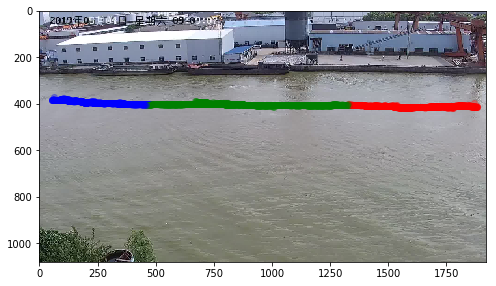

906


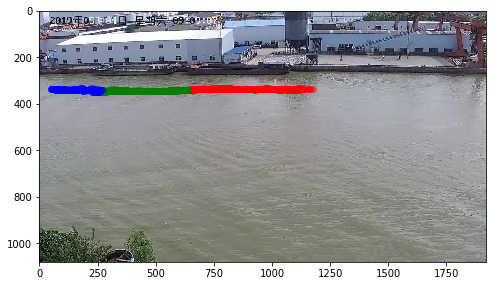

797


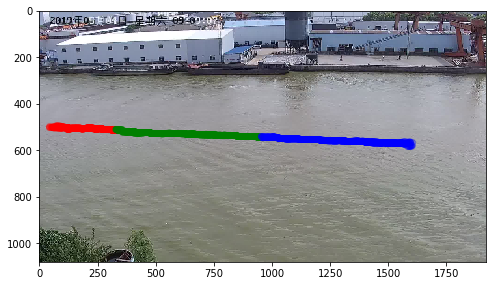

660


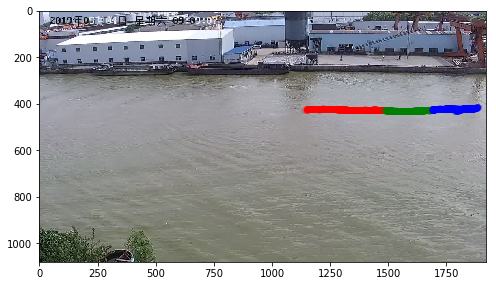

589


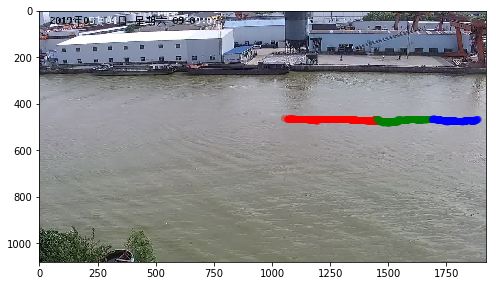

535


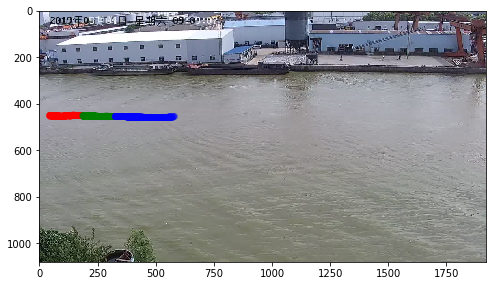

516


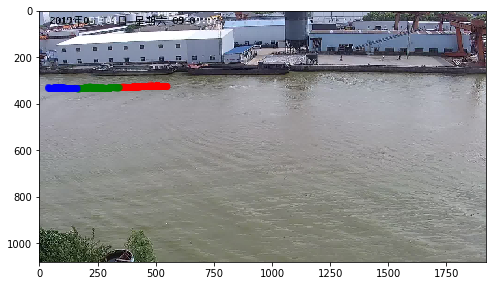

465


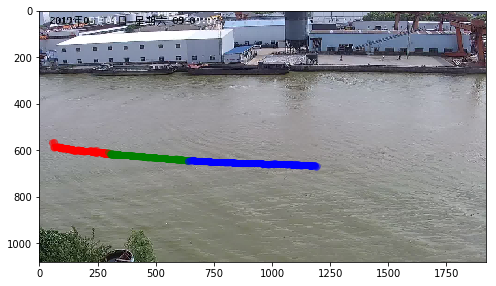

444


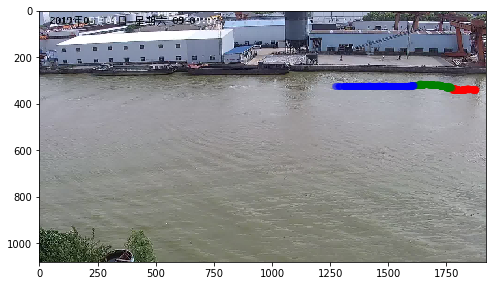

399


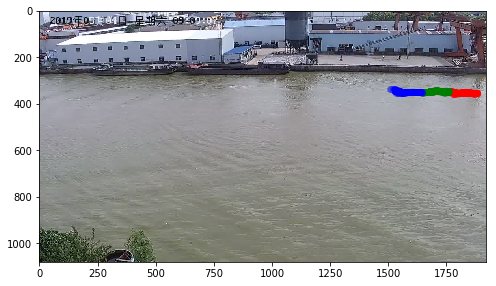

298


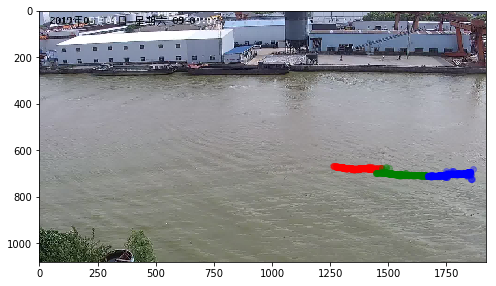

In [12]:
for chain in sorted([chain for chain in collected['chain_list']], reverse=True, key=len)[:21]:
    pt_arr = np.array([box['pt'] for box in chain])
    pt_smoothed_arr = np.array([box['pt_smoothed'] for box in chain])
    if len(pt_arr) <2:
        print('suppressed')
        continue
    print(len(pt_arr))
    x,y = pt_arr[:,::2].mean(axis=1),pt_arr[:,1::2].mean(axis=1)
    x_bar,y_bar = pt_smoothed_arr[:,::2].mean(axis=1),pt_smoothed_arr[:,1::2].mean(axis=1)
    
    plt.figure(figsize=(8,6))
    plot_trace(x_bar, y_bar)
    plot_trace(x,y, alpha=0.3)
    plt.imshow(background)
    plt.show()

In [17]:
loaded = copy.deepcopy(loaded_raw)
collected = collect_predict(loaded, chain_smoother=smoother, jump_tol=60, verbose=True, pixel_threshold=70)
sorted([len(chain) for chain in collected['chain_list']], reverse=True)

44 chain detected


[12951,
 12917,
 1611,
 1607,
 1440,
 1384,
 1281,
 1253,
 1243,
 979,
 906,
 797,
 738,
 660,
 590,
 535,
 465,
 444,
 399,
 298,
 190,
 81,
 40,
 39,
 39,
 32,
 32,
 26,
 26,
 24,
 13,
 12,
 11,
 7,
 5,
 4,
 3,
 3,
 2,
 2,
 2,
 1,
 1,
 1]

12951


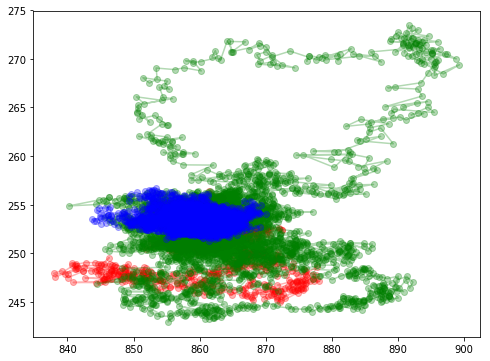

12917


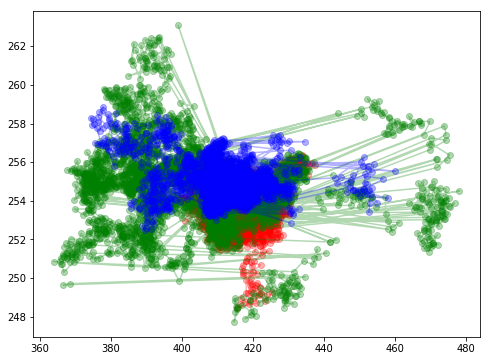

1611


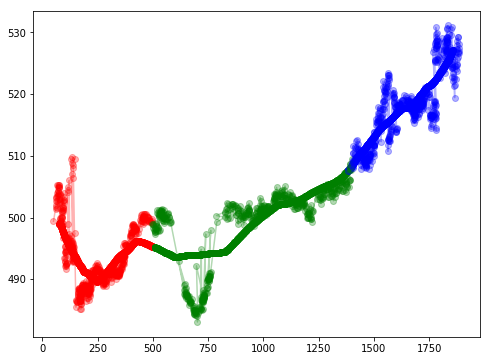

1607


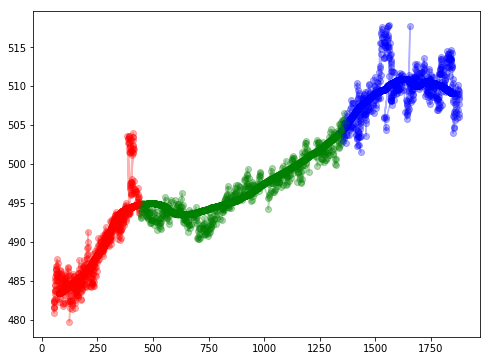

1440


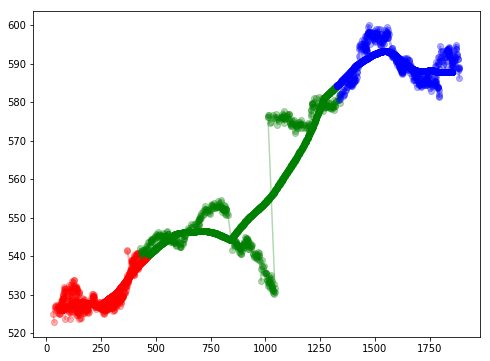

1384


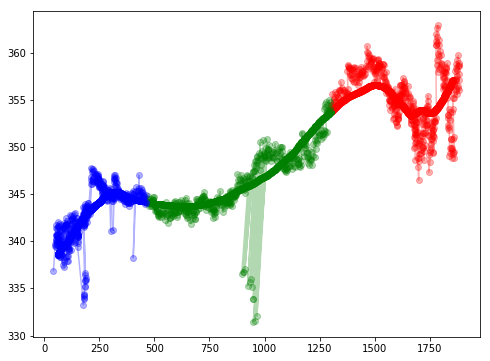

1281


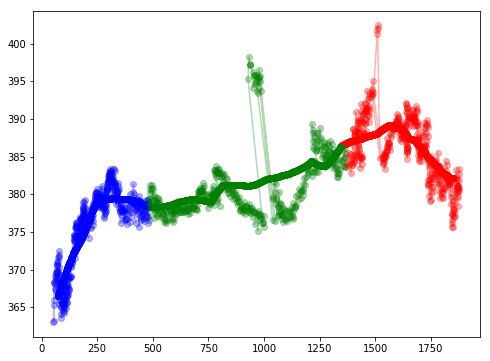

1253


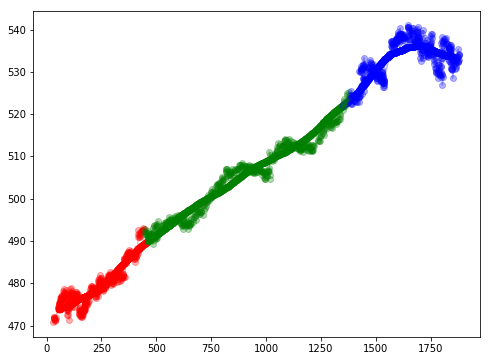

1243


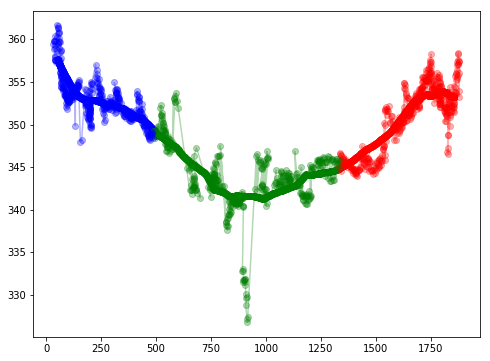

979


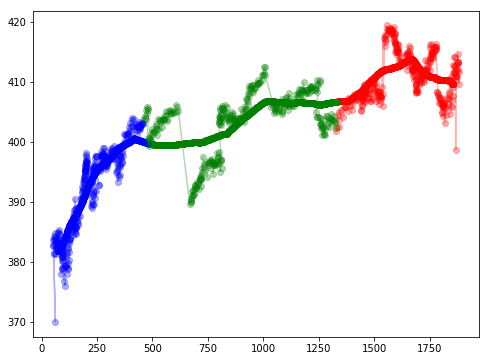

906


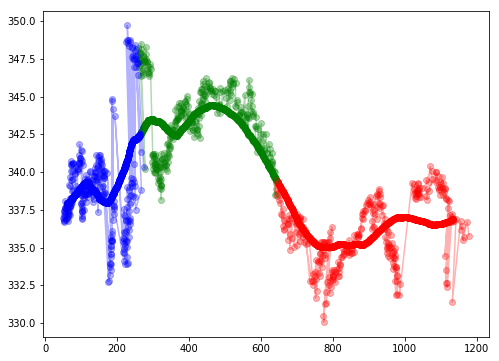

797


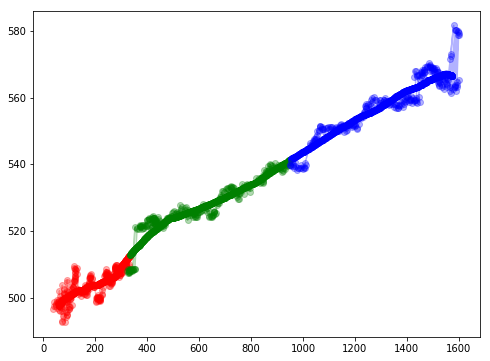

738


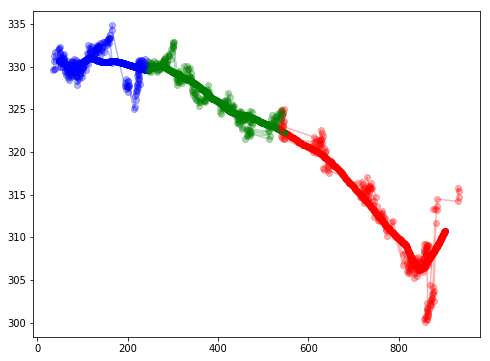

660


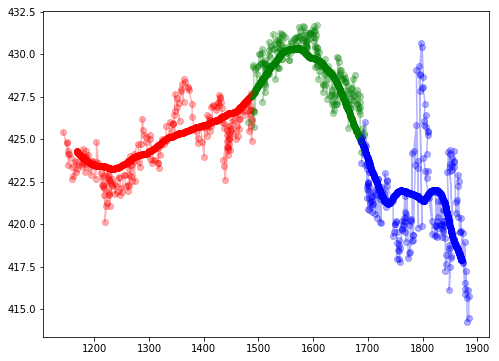

590


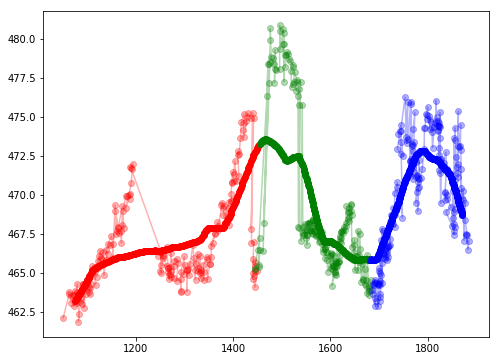

535


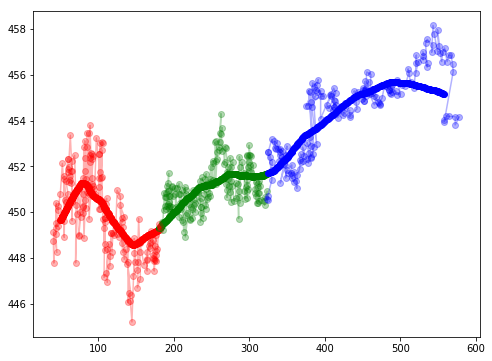

465


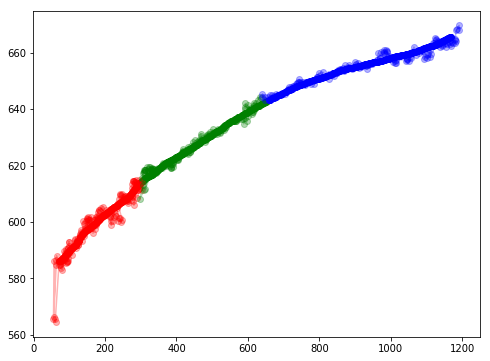

444


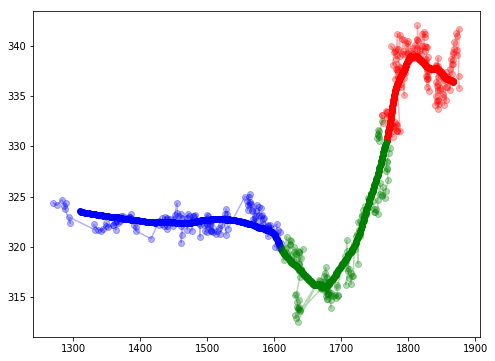

399


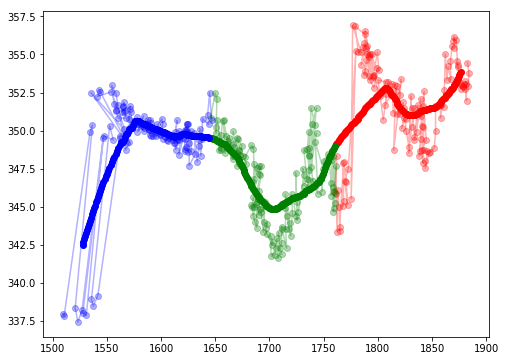

298


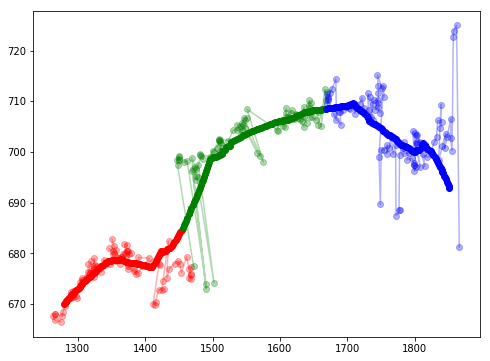

190


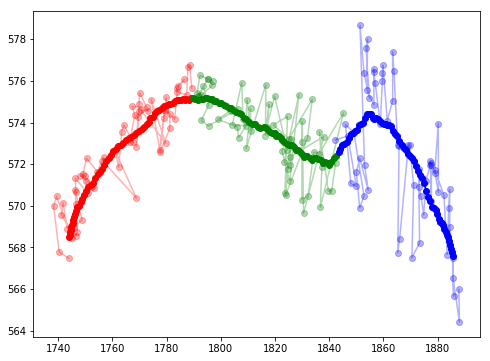

In [18]:
for chain in sorted([chain for chain in collected['chain_list']], reverse=True, key=len)[:21]:
    pt_arr = np.array([box['pt'] for box in chain])
    pt_smoothed_arr = np.array([box['pt_smoothed'] for box in chain])
    if len(pt_arr) <2:
        print('suppressed')
        continue
    print(len(pt_arr))
    x,y = pt_arr[:,::2].mean(axis=1),pt_arr[:,1::2].mean(axis=1)
    x_bar,y_bar = pt_smoothed_arr[:,::2].mean(axis=1),pt_smoothed_arr[:,1::2].mean(axis=1)
    
    plt.figure(figsize=(8,6))
    plot_trace(x_bar, y_bar)
    plot_trace(x,y, alpha=0.3)
    plt.show()

12951


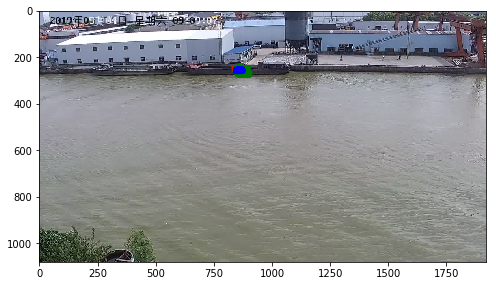

12917


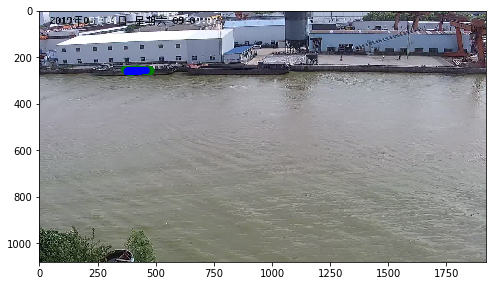

1611


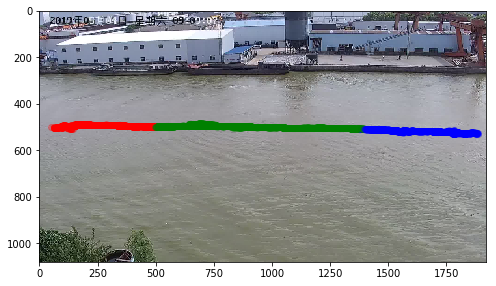

1607


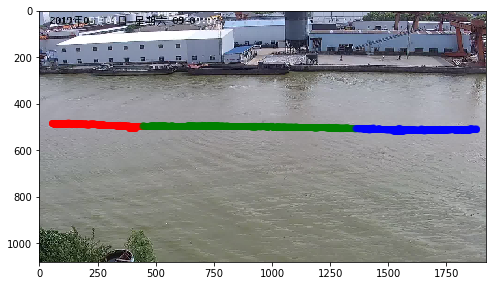

1440


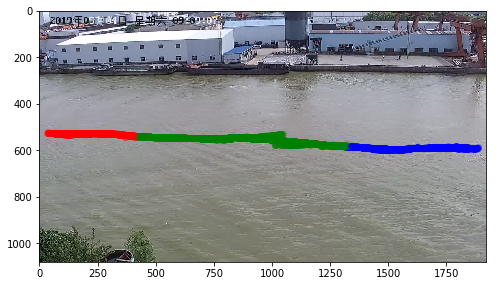

1384


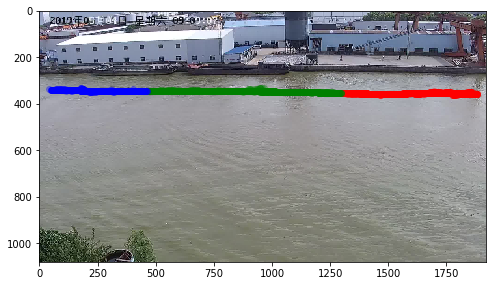

1281


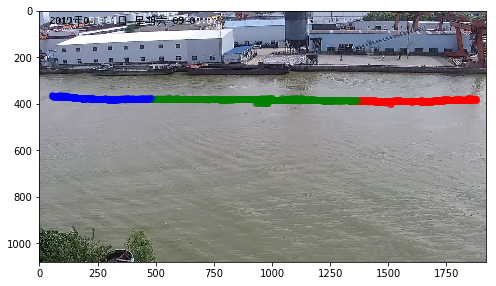

1253


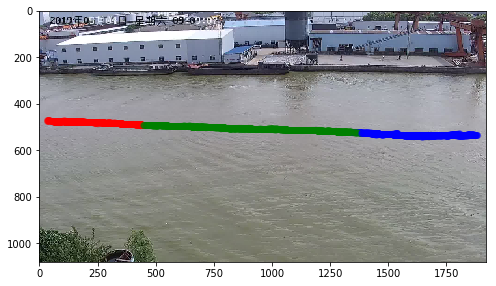

1243


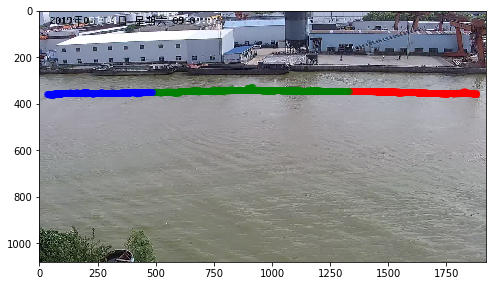

979


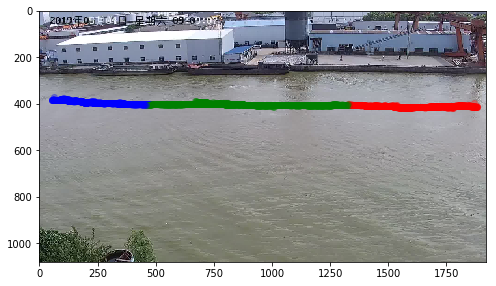

906


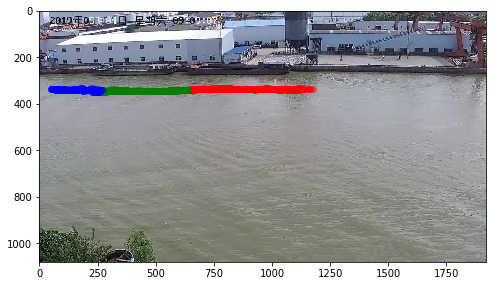

797


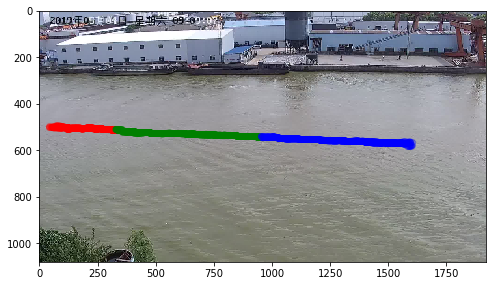

738


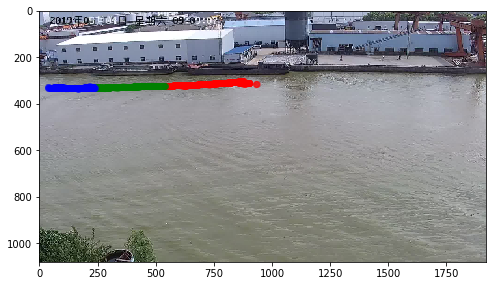

660


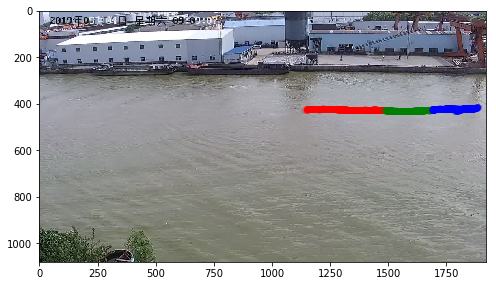

590


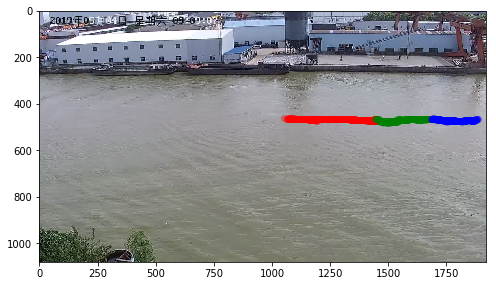

535


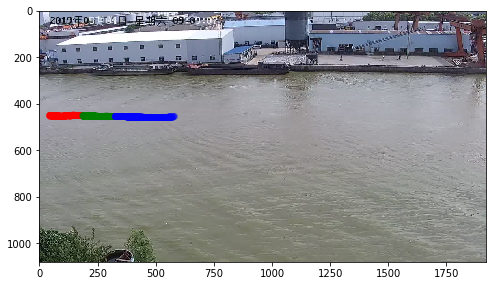

465


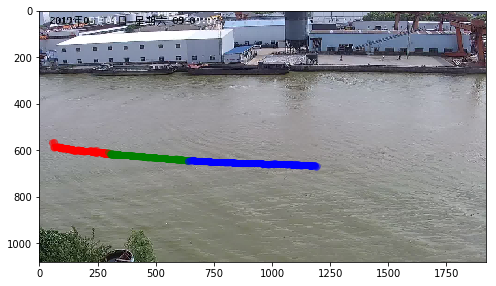

444


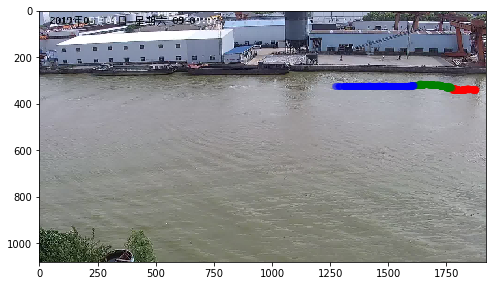

399


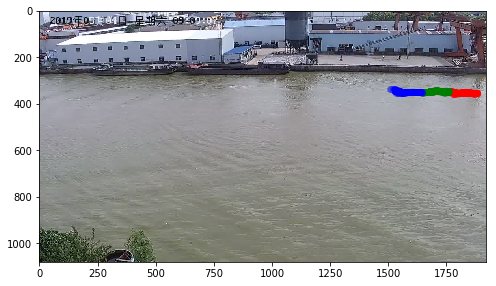

298


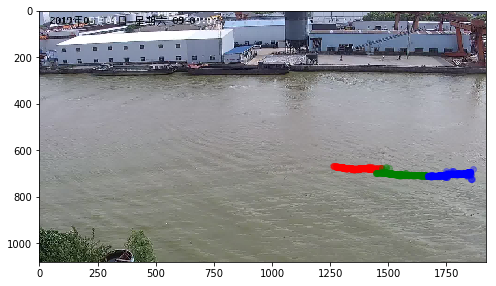

190


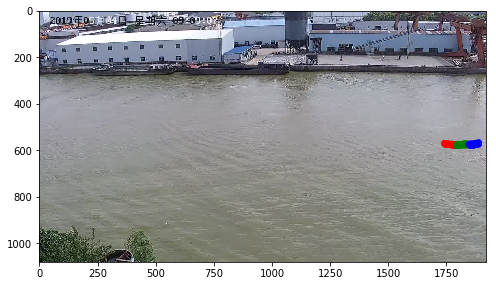

In [19]:
for chain in sorted([chain for chain in collected['chain_list']], reverse=True, key=len)[:21]:
    pt_arr = np.array([box['pt'] for box in chain])
    pt_smoothed_arr = np.array([box['pt_smoothed'] for box in chain])
    if len(pt_arr) <2:
        print('suppressed')
        continue
    print(len(pt_arr))
    x,y = pt_arr[:,::2].mean(axis=1),pt_arr[:,1::2].mean(axis=1)
    x_bar,y_bar = pt_smoothed_arr[:,::2].mean(axis=1),pt_smoothed_arr[:,1::2].mean(axis=1)
    
    plt.figure(figsize=(8,6))
    plot_trace(x_bar, y_bar)
    plot_trace(x,y, alpha=0.3)
    plt.imshow(background)
    plt.show()